**Competition: Harmful Brain Activity Classification**

**Approach Overview:**

- **Spatio-Temporal Transformer Models**: We've selected Spatio-Temporal Transformer Models to effectively capture the dynamic frequency changes over time, taking advantage of both the spatial and temporal dimensions of the data. This strategy is applied exclusively to Spectrogram Data.

- **Data Preparation**: Each diagnostic record in `train.csv` corresponds to 300 spectrogram records. We'll assess the integrity of these spectrogram records, opting to either interpolate missing values or exclude incomplete entries from our training dataset.

- **Model Selection**: For our analysis, we're utilizing the pretrained `google/mobilenet_v2_1.0_224` model, chosen for its compact size (~3.5M parameters), making it well-suited for our computational needs.

- **Dimensionality Reduction via PCA**: We'll apply PCA to condense the 400 spectrogram features down to 224 principal components (PCs), optimizing our feature set for the model.

- **Focusing on Key Segments**: Given that expert consensus often highlights the central 10 seconds of EEG data as critical, we'll narrow our 10-minute, 300-record spectrogram frame to the central 224 records for analysis.

- **Feature Transformation**:
    - **Time Dimension Sequence Transformation**: We'll transform the data into a sequence of 224 vectors (time steps), each comprising 224 elements (spectrogram frequency components - PCs). This format is ideal for models that specialize in temporal dynamics analysis.
    - **Frequency Dimension Sequence Transformation**: As an alternative approach, we'll generate sequences of 224 spectrogram frequency components, each vector containing 224 elements (time steps). This method allows for a detailed examination of spectral patterns and their temporal evolution.

- **Data Formatting for Model Input**: We'll convert our 2D array (224x224) into a 3-channel tensor, filling the 2nd and 3rd channels with zeros to adapt to the RGB input requirements of our model. It's important to note that we'll train and evaluate the model separately on each dimension to determine the most effective approach.

- **Model Configuration for Multiple Labels**: The pretrained model will be adjusted to predict a probability distribution across 6 labels.

- **Evaluation Criterion**: The KLDivLoss function will serve as our evaluation metric, guiding the optimization process.

- **Hyperparameter Tuning and Model Training**: We'll experiment with various hyperparameters (learning rate, batch size, epochs) to refine our model's performance.

- **Prediction and Submission**: Our final step involves predicting the probability distribution for the 6 labels on the test dataset and submitting these predictions for evaluation.

- **Note**: This notebook operates on a sample dataset for efficiency during this demonstration. For the final submission, I will utilize the model that has been fine-tuned on a larger dataset outside of this notebook


In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import os

import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm

data_path = '/kaggle/input/hms-harmful-brain-activity-classification'
sg_path = f"{data_path}/train_spectrograms"
sg_test_path = f"{data_path}/test_spectrograms"

# Check if GPU is available and set device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [2]:
#read train set
train_df_M = pd.read_csv(f'{data_path}/train.csv')
print(train_df_M.shape)
train_df_M.head()

(106800, 15)


,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0


Train Data:
                   Count  Percentage
expert_consensus                   
Seizure           20933        20.0
GRDA              18861        18.0
Other             18808        18.0
GPD               16702        16.0
LRDA              16640        16.0
LPD               14856        14.0


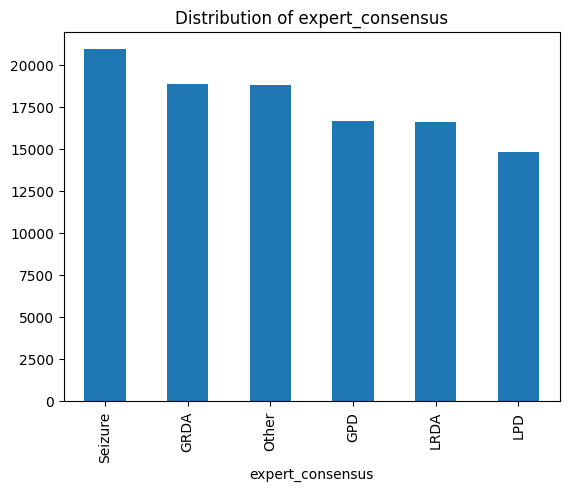

In [3]:
# Plot the distribution of expert_consensus
print('Train Data:\n', train_df_M['expert_consensus'].value_counts().rename('Count').to_frame().assign(Percentage=lambda x: round((x / x.sum()) * 100)))
plot = train_df_M['expert_consensus'].value_counts().plot(kind='bar', title='Distribution of expert_consensus')

> <span style="color:blue">**Not very balanced, but relatively even distribution!**

In [4]:
#proceed with sample to save compute and show other steps - I will load the models finetuned on larger dataset to generate final submission
train_df = train_df_M.sample(300, random_state=52).reset_index(drop=True)
print('Train Data:\n', train_df['expert_consensus'].value_counts().rename('Count').to_frame().assign(Percentage=lambda x: round((x / x.sum()) * 100)))

Train Data:
                   Count  Percentage
expert_consensus                   
LRDA                 57        19.0
GPD                  54        18.0
Seizure              52        17.0
LPD                  48        16.0
GRDA                 48        16.0
Other                41        14.0


**Examine Spectrogram Data**
1. Check if there are any nulls/NaNs in spectrogram series referred by train records
2. Check correlation in 400 spectrogram features

In [5]:
#Check if there are nulls SG data
train_checked_count = 0
null_count = 0
for index, row in train_df.iterrows():
    parquet_path = f"{sg_path}/{row['spectrogram_id']}.parquet"
    parquet_df = pd.read_parquet(parquet_path)
    # Filter records based on spectrogram_label_offset_seconds
    filtered_df = parquet_df[(parquet_df['time'] >= row['spectrogram_label_offset_seconds']) & 
                             (parquet_df['time'] < row['spectrogram_label_offset_seconds'] + 600)]
    if filtered_df.isnull().any().any():
        train_df.at[index, 'SG_NullData_Ind'] = True
    else:
        train_df.at[index, 'SG_NullData_Ind'] = False

print(train_df['SG_NullData_Ind'].value_counts())
print('\ncheck expert consensus where sg is not null...')
print(train_df[train_df['SG_NullData_Ind'] == False]['expert_consensus'].value_counts().rename('Count').to_frame().assign(Percentage=lambda x: round((x / x.sum()) * 100)))

SG_NullData_Ind
False    278
True      22
Name: count, dtype: int64

check expert consensus where sg is not null...
                  Count  Percentage
expert_consensus                   
GPD                  53        19.0
LRDA                 53        19.0
Seizure              49        18.0
LPD                  44        16.0
GRDA                 42        15.0
Other                37        13.0


> <span style="color:blue">**Given that null/NaN instances constitute a small portion of our overall dataset, I've opted to exclude these records from our training set.**

In [6]:
#drop nulls from training
train_df = train_df[train_df['SG_NullData_Ind'] != True]
train_df.shape

(278, 16)

In [7]:
#Examine Spectrogram records correlation

#the file contains all the records referred by required train records after ignoring nulls
#sg_records_ref = '/kaggle/input/harmful-brain-activity-spectrogram-data/train_spectrogram_records.csv' 
#not using this here, checking on sample train below
#sg_records_df = pd.read_csv(sg_records_ref)

train_df = train_df.sort_values(by='spectrogram_id')
# load spectrogram
sg_records_referred_list = []
spectrogram_id = 0
for index, row in train_df.iterrows():
    if row['spectrogram_id'] != spectrogram_id:
        parquet_path = f"{sg_path}/{row['spectrogram_id']}.parquet"
        parquet_df = pd.read_parquet(parquet_path)
        spectrogram_id = row['spectrogram_id']
    # Filter records based on spectrogram_label_offset_seconds
    filtered_df = parquet_df[(parquet_df['time'] >= row['spectrogram_label_offset_seconds']) & 
                             (parquet_df['time'] < row['spectrogram_label_offset_seconds'] + 600)].copy()
    filtered_df['spectrogram_id'] = row['spectrogram_id']
    sg_records_referred_list.append(filtered_df)

# Concatenate all filtered records into a single DataFrame
sg_records_df = pd.concat(sg_records_referred_list, ignore_index=True)
sg_records_df = sg_records_df.drop_duplicates()

print(sg_records_df.shape)
sg_records_df.head()

(78090, 402)


,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,LL_2.34,LL_2.54,LL_2.73,LL_2.93,LL_3.13,LL_3.32,LL_3.52,LL_3.71,LL_3.91,LL_4.1,LL_4.3,LL_4.49,LL_4.69,LL_4.88,LL_5.08,LL_5.27,LL_5.47,LL_5.66,LL_5.86,LL_6.05,LL_6.25,LL_6.45,LL_6.64,LL_6.84,LL_7.03,LL_7.23,LL_7.42,LL_7.62,LL_7.81,LL_8.01,LL_8.2,LL_8.4,LL_8.59,LL_8.79,LL_8.98,LL_9.18,LL_9.38,LL_9.57,LL_9.77,LL_9.96,LL_10.16,LL_10.35,LL_10.55,LL_10.74,LL_10.94,LL_11.13,LL_11.33,LL_11.52,LL_11.72,LL_11.91,LL_12.11,LL_12.3,LL_12.5,LL_12.7,LL_12.89,LL_13.09,LL_13.28,LL_13.48,LL_13.67,LL_13.87,LL_14.06,LL_14.26,LL_14.45,LL_14.65,LL_14.84,LL_15.04,LL_15.23,LL_15.43,LL_15.63,LL_15.82,LL_16.02,LL_16.21,LL_16.41,LL_16.6,LL_16.8,LL_16.99,LL_17.19,LL_17.38,LL_17.58,LL_17.77,LL_17.97,LL_18.16,LL_18.36,LL_18.55,LL_18.75,LL_18.95,LL_19.14,LL_19.34,LL_19.53,LL_19.73,LL_19.92,RL_0.59,RL_0.78,RL_0.98,RL_1.17,RL_1.37,RL_1.56,RL_1.76,RL_1.95,RL_2.15,RL_2.34,RL_2.54,RL_2.73,RL_2.93,RL_3.13,RL_3.32,RL_3.52,RL_3.71,RL_3.91,RL_4.1,RL_4.3,RL_4.49,RL_4.69,RL_4.88,RL_5.08,RL_5.27,RL_5.47,RL_5.66,RL_5.86,RL_6.05,RL_6.25,RL_6.45,RL_6.64,RL_6.84,RL_7.03,RL_7.23,RL_7.42,RL_7.62,RL_7.81,RL_8.01,RL_8.2,RL_8.4,RL_8.59,RL_8.79,RL_8.98,RL_9.18,RL_9.38,RL_9.57,RL_9.77,RL_9.96,RL_10.16,RL_10.35,RL_10.55,RL_10.74,RL_10.94,RL_11.13,RL_11.33,RL_11.52,RL_11.72,RL_11.91,RL_12.11,RL_12.3,RL_12.5,RL_12.7,RL_12.89,RL_13.09,RL_13.28,RL_13.48,RL_13.67,RL_13.87,RL_14.06,RL_14.26,RL_14.45,RL_14.65,RL_14.84,RL_15.04,RL_15.23,RL_15.43,RL_15.63,RL_15.82,RL_16.02,RL_16.21,RL_16.41,RL_16.6,RL_16.8,RL_16.99,RL_17.19,RL_17.38,RL_17.58,RL_17.77,RL_17.97,RL_18.16,RL_18.36,RL_18.55,RL_18.75,RL_18.95,RL_19.14,RL_19.34,RL_19.53,RL_19.73,RL_19.92,LP_0.59,LP_0.78,LP_0.98,LP_1.17,LP_1.37,LP_1.56,LP_1.76,LP_1.95,LP_2.15,LP_2.34,LP_2.54,LP_2.73,LP_2.93,LP_3.13,LP_3.32,LP_3.52,LP_3.71,LP_3.91,LP_4.1,LP_4.3,LP_4.49,LP_4.69,LP_4.88,LP_5.08,LP_5.27,LP_5.47,LP_5.66,LP_5.86,LP_6.05,LP_6.25,LP_6.45,LP_6.64,LP_6.84,LP_7.03,LP_7.23,LP_7.42,LP_7.62,LP_7.81,LP_8.01,LP_8.2,LP_8.4,LP_8.59,LP_8.79,LP_8.98,LP_9.18,LP_9.38,LP_9.57,LP_9.77,LP_9.96,LP_10.16,LP_10.35,LP_10.55,LP_10.74,LP_10.94,LP_11.13,LP_11.33,LP_11.52,LP_11.72,LP_11.91,LP_12.11,LP_12.3,LP_12.5,LP_12.7,LP_12.89,LP_13.09,LP_13.28,LP_13.48,LP_13.67,LP_13.87,LP_14.06,LP_14.26,LP_14.45,LP_14.65,LP_14.84,LP_15.04,LP_15.23,LP_15.43,LP_15.63,LP_15.82,LP_16.02,LP_16.21,LP_16.41,LP_16.6,LP_16.8,LP_16.99,LP_17.19,LP_17.38,LP_17.58,LP_17.77,LP_17.97,LP_18.16,LP_18.36,LP_18.55,LP_18.75,LP_18.95,LP_19.14,LP_19.34,LP_19.53,LP_19.73,LP_19.92,RP_0.59,RP_0.78,RP_0.98,RP_1.17,RP_1.37,RP_1.56,RP_1.76,RP_1.95,RP_2.15,RP_2.34,RP_2.54,RP_2.73,RP_2.93,RP_3.13,RP_3.32,RP_3.52,RP_3.71,RP_3.91,RP_4.1,RP_4.3,RP_4.49,RP_4.69,RP_4.88,RP_5.08,RP_5.27,RP_5.47,RP_5.66,RP_5.86,RP_6.05,RP_6.25,RP_6.45,RP_6.64,RP_6.84,RP_7.03,RP_7.23,RP_7.42,RP_7.62,RP_7.81,RP_8.01,RP_8.2,RP_8.4,RP_8.59,RP_8.79,RP_8.98,RP_9.18,RP_9.38,RP_9.57,RP_9.77,RP_9.96,RP_10.16,RP_10.35,RP_10.55,RP_10.74,RP_10.94,RP_11.13,RP_11.33,RP_11.52,RP_11.72,RP_11.91,RP_12.11,RP_12.3,RP_12.5,RP_12.7,RP_12.89,RP_13.09,RP_13.28,RP_13.48,RP_13.67,RP_13.87,RP_14.06,RP_14.26,RP_14.45,RP_14.65,RP_14.84,RP_15.04,RP_15.23,RP_15.43,RP_15.63,RP_15.82,RP_16.02,RP_16.21,RP_16.41,RP_16.6,RP_16.8,RP_16.99,RP_17.19,RP_17.38,RP_17.58,RP_17.77,RP_17.97,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92,spectrogram_id
0,787,5.69,5.59,7.00,3.93,2.95,3.07,6.29,7.85,8.68,8.52,4.36,1.16,1.44,2.24,2.05,1.89,1.63,5.38,7.07,6.58,6.40,5.19,1.94,1.19,2.01,1.08,1.27,1.25,2.92,3.28,3.24,3.26,2.19,1.28,1.19,1.24,0.85,0.61,0.70,0.74,0.67,0.62,0.55,0.41,0.44,0.67,0.46,0.78,0.98,1.24,1.24,1.23,1.25,1.13,1.12,1.32,1.29,1.21,1.61,1.73,1.67,1.56,1.23,0.63,1.15,1.79,1.61,1.93,1.72,1.53,1.66,1.67,1.76,1.83,1.36,1.32,1.56,1.39,2.24,2.12,2.40,2.22,1.94,2.05,1.86,2.08,1.76,1.55,1.88,1.73,1.88,1.66,1.92,1.50,1.64,1.72,1.19,0.94,0.76,1.16,2.64,2.59,3.46,3.02,2.12,2.04,9.92,11.67,12.530000,11.90,5.60,2.22,2.12,2.25,1.95,1.27,1.04,1.68,2.13,2.1

In [8]:
corr = sg_records_df.drop(columns=['time', 'spectrogram_id']).corr()
corr.style.background_gradient(cmap='coolwarm')

> <span style="color:blue">**There is definitely strong correlation between some of the features! Let's check the clustering!**

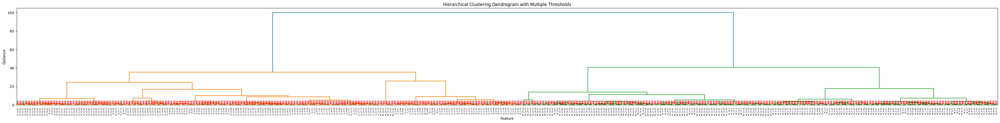

Number of unique features at threshold 1: 106
Number of unique features at threshold 2: 56
Number of unique features at threshold 3: 34
Number of unique features at threshold 4: 25


In [9]:
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

linked = linkage(corr, 'ward')
plt.figure(figsize=(50, 5))
dendrogram(linked, labels=corr.index.tolist(), leaf_rotation=90)

# Add horizontal lines at thresholds
thresholds = [1, 2, 3, 4]  
for thr in thresholds:
    plt.axhline(y=thr, color='r', linestyle='--')

plt.title('Hierarchical Clustering Dendrogram with Multiple Thresholds')
plt.xlabel('Feature')
plt.ylabel('Distance')
plt.show()

for thr in thresholds:
    # Form flat clusters based on the threshold
    clusters = fcluster(linked, thr, criterion='distance')
    # Count the number of clusters 
    num_unique_clusters = len(set(clusters))
    print(f'Number of unique features at threshold {thr}: {num_unique_clusters}')

> <span style="color:blue">**Applying PCA even at threshold 1 results in 106 PCs (bit different if you run on entire SG referred data), so it is ok to use clustering threshold less than 1 and condense features to 224, I just experimented a bit with threshold (< 1) to get 224**

In [10]:
# Define the threshold distance
thr = 0.4286 #this 0.264 if you run on entire train SG records 

# Form flat clusters based on the threshold distance
clusters = fcluster(linked, thr, criterion='distance')

# The `clusters` variable contains the cluster labels for each feature
# Count the number of unique clusters (which corresponds to the number of unique features to keep)
num_unique_clusters = len(set(clusters))
print(f'Number of unique features at threshold {thr}: {num_unique_clusters}')

# Create a DataFrame that associates each feature with its cluster label
cluster_assignments = pd.DataFrame({'Feature': corr.columns, 'Cluster': clusters})

# Group the features by cluster
grouped_features = cluster_assignments.groupby('Cluster')['Feature'].apply(list)
grouped_features

Number of unique features at threshold 0.4286: 224


Cluster
1                [LP_14.65, LP_14.84]
2                [LP_14.26, LP_14.45]
3                [LP_15.63, LP_15.82]
4      [LP_15.04, LP_15.23, LP_15.43]
5                [LP_16.02, LP_16.21]
                    ...              
220       [RL_7.62, RL_7.81, RL_8.01]
221                         [RL_7.42]
222       [RL_8.98, RL_9.18, RL_9.38]
223                [RP_8.98, RP_9.18]
224                         [RP_9.38]
Name: Feature, Length: 224, dtype: object

In [11]:
#apply PCA to condense the 400 spectrogram features down to 224 principal components (PCs)

# Dataframe to store the principal components from each cluster
principal_components_df = pd.DataFrame()

for cluster_label, features in grouped_features.items():
    # Extract the subset of the DataFrame corresponding to the current cluster's features
    cluster_data = sg_records_df[features]
    
    # Standardize the features
    scaler = StandardScaler()
    cluster_data_standardized = scaler.fit_transform(cluster_data)
    
    # Initialize PCA with 1 since we want to represent each cluster with a single component
    pca = PCA(n_components=1)
    
    # Fit PCA on the cluster data and transform the data
    principal_component = pca.fit_transform(cluster_data_standardized)
    
    # Convert the principal component to a DataFrame
    principal_component_df = pd.DataFrame(principal_component, columns=[f'PCA_{cluster_label}'])
    
    # Concatenate with the principal_components_df
    principal_components_df = pd.concat([principal_components_df, principal_component_df], axis=1)

# append keys
keys = sg_records_df[['spectrogram_id', 'time']].reset_index(drop=True)

# Concatenate the keys and the principal components
final_pc_df = pd.concat([keys, principal_components_df], axis=1)
print(final_pc_df.shape)
final_pc_df.head()


(78090, 226)


,spectrogram_id,time,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,PCA_49,PCA_50,PCA_51,PCA_52,PCA_53,PCA_54,PCA_55,PCA_56,PCA_57,PCA_58,PCA_59,PCA_60,PCA_61,PCA_62,PCA_63,PCA_64,PCA_65,PCA_66,PCA_67,PCA_68,PCA_69,PCA_70,PCA_71,PCA_72,PCA_73,PCA_74,PCA_75,PCA_76,PCA_77,PCA_78,PCA_79,PCA_80,PCA_81,PCA_82,PCA_83,PCA_84,PCA_85,PCA_86,PCA_87,PCA_88,PCA_89,PCA_90,PCA_91,PCA_92,PCA_93,PCA_94,PCA_95,PCA_96,PCA_97,PCA_98,PCA_99,PCA_100,PCA_101,PCA_102,PCA_103,PCA_104,PCA_105,PCA_106,PCA_107,PCA_108,PCA_109,PCA_110,PCA_111,PCA_112,PCA_113,PCA_114,PCA_115,PCA_116,PCA_117,PCA_118,PCA_119,PCA_120,PCA_121,PCA_122,PCA_123,PCA_124,PCA_125,PCA_126,PCA_127,PCA_128,PCA_129,PCA_130,PCA_131,PCA_132,PCA_133,PCA_134,PCA_135,PCA_136,PCA_137,PCA_138,PCA_139,PCA_140,PCA_141,PCA_142,PCA_143,PCA_144,PCA_145,PCA_146,PCA_147,PCA_148,PCA_149,PCA_150,PCA_151,PCA_152,PCA_153,PCA_154,PCA_155,PCA_156,PCA_157,PCA_158,PCA_159,PCA_160,PCA_161,PCA_162,PCA_163,PCA_164,PCA_165,PCA_166,PCA_167,PCA_168,PCA_169,PCA_170,PCA_171,PCA_172,PCA_173,PCA_174,PCA_175,PCA_176,PCA_177,PCA_178,PCA_179,PCA_180,PCA_181,PCA_182,PCA_183,PCA_184,PCA_185,PCA_186,PCA_187,PCA_188,PCA_189,PCA_190,PCA_191,PCA_192,PCA_193,PCA_194,PCA_195,PCA_196,PCA_197,PCA_198,PCA_199,PCA_200,PCA_201,PCA_202,PCA_203,PCA_204,PCA_205,PCA_206,PCA_207,PCA_208,PCA_209,PCA_210,PCA_211,PCA_212,PCA_213,PCA_214,PCA_215,PCA_216,PCA_217,PCA_218,PCA_219,PCA_220,PCA_221,PCA_222,PCA_223,PCA_224
0,12849827,787,-0.053309,-0.054186,-0.053229,-0.064960,-0.054522,-0.065088,-0.037776,-0.036544,-0.034778,-0.066126,-0.064077,-0.069723,-0.070891,-0.041041,-0.072282,-0.041940,-0.060984,-0.072745,-0.059738,-0.072951,-0.041208,-0.036415,-0.042922,-0.047232,-0.032013,-0.029844,-0.029382,-0.028749,-0.027549,-0.046492,-0.043495,-0.031747,-0.062331,-0.060874,-0.042274,-0.061692,-0.074957,-0.043240,-0.042440,-0.040108,-0.058562,-0.067456,-0.066265,-0.067579,-0.044739,-0.047570,-0.053254,-0.061797,-0.039842,-0.048428,-0.035744,-0.048635,-0.035544,-0.055471,-0.058350,-0.054565,-0.038376,-0.050389,-0.051208,-0.054069,-0.063672,-0.054434,-0.060848,-0.066970,-0.038709,-0.058008,-0.058158,-0.038876,-0.059380,-0.059705,-0.062621,-0.043340,-0.057508,-0.056498,-0.068850,-0.040508,-0.060844,-0.077114,-0.079924,-0.117765,-0.041707,-0.043140,-0.042473,-0.056721,-0.053608,-0.066417,-0.037443,-0.056628,-0.043373,-0.057084,-0.060279,-0.057803,-0.057700,-0.058388,-0.039375,-0.040708,-0.057553,-0.057349,-0.057841,-0.058523,-0.042274,-0.059561,-0.075192,-0.059407,-0.041774,-0.056634,-0.057205,-0.059597,-0.057746,-0.041074,-0.081733,-0.078376,-0.049736,-0.052101,-0.055066,-0.055465,-0.052700,-0.055532,-0.051468,-0.050735,-0.075653,-0.065786,-0.063423,-0.061479,-0.043073,-0.069748,-0.047737,-0.071922,-0.067252,-0.065034,-0.062008,-0.044072,-0.043573,-0.074520,-0.062061,-0.044905,-0.044606,-0.043673,-0.061507,-0.042374,-0.063882,-0.047104,-0.044805,-0.069292,-0.046471,-0.048403,-0.047037,-0.048603,-0.076534,-0.065156,-0.044639,-0.062299,-0.044306,-0.062629,-0.045572,-0.080456,-0.063722,-0.064161,-0.046538,-0.065403,-0.064893,-0.067407,-0.063323,-0.078512,-0.076664,-0.064460,-0.046904,-0.077146,-0.062164,-0.075562,-0.042473,-0.063886,-0.071930,-0.066586,-0.061708,-0.041407,-0.043040,-0.048969,-0.047104,-0.045405,-0.073512,-0.046371,-0.068355,-0.066151,-0.045105,-0.070041,-0.065422,-0.069636,-0.053400,-0.066443,-0.050302,-0.072824,-0.051268,-0.077471,-0.054466,-0.068680,-0.070505,-0.066183,-0.063000,-0.045172,-0.069723,-0.071710,-0.064545,-0.095769,-0.058803,-0.063132,-0.044972,-0.063725,-0.043873,-0.046438,-0.047970,-0.042740,-0.066083,-0.047770,-0.073801,-0.040575,-0.042607,-0.061569,-0.063472,-0.083184,-0.051135,-0.079392,-0.063890,-0.045039
1,12849827,789,-0.053287,-0.054179,-0.05

### Prep the data for training

In [12]:
# create probability distribution columns
vote_columns = ['seizure_vote', 'lpd_vote', 'gpd_vote', 'lrda_vote', 'grda_vote', 'other_vote']
prob_columns = ['seizure_prob', 'lpd_prob', 'gpd_prob', 'lrda_prob', 'grda_prob', 'other_prob']

# Calculate the total votes for each row
train_df['total_votes'] = train_df[vote_columns].sum(axis=1)

# Calculate the probability for each label
for vote_col, prob_col in zip(vote_columns, prob_columns):
    train_df[prob_col] = train_df[vote_col] / train_df['total_votes']
train_df.head()

,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,SG_NullData_Ind,total_votes,seizure_prob,lpd_prob,gpd_prob,lrda_prob,grda_prob,other_prob
216,3636015289,64,334.0,12849827,94,786.0,1491170039,34998,Seizure,6,0,5,0,0,2,False,13,0.461538,0.0,0.384615,0.000000,0.00,0.153846
89,839643180,112,520.0,12849827,209,1542.0,3013632666,34998,GPD,0,0,4,0,0,1,False,5,0.000000,0.0,0.800000,0.000000,0.00,0.200000
163,4233815620,176,696.0,12849827,396,2684.0,2592285233,34998,GPD,0,0,3,0,0,1,False,4,0.000000,0.0,0.750000,0.000000,0.00,0.250000
16,3896730169,5,12.0,13289232,5,12.0,1383486944,29182,GPD,1,0,4,1,3,3,False,12,0.083333,0.0,0.333333,0.083333,0.25,0.250000
196,1487486976,3,18.0,14160642,12,928.0,3530417426,1218,LPD,0,5,0,0,0,0,False,5,0.000000,1.0,0.000000,0.000000,0.00,0.000000


In [13]:
#combine spectrogram frame time series data into list and include in one training record
processed_data = {} 
EmptySGs = []
for index, row in train_df.iterrows():
    # Extract relevant information from the row
    label_id = row['label_id']
    spectrogram_id = row['spectrogram_id']
    offset_seconds = row['spectrogram_label_offset_seconds'] + 76 # skip 76 seconds to get the middle 448 seconds
    labels = row[['seizure_prob', 'lpd_prob', 'gpd_prob', 'lrda_prob', 'grda_prob', 'other_prob']]
    
    # Filter the sg_records_pc for the current spectrogram_id and time window
    #Note: Not taking 300 SG records, we only get central 224 records
    mask = (final_pc_df['spectrogram_id'] == spectrogram_id) & \
           (final_pc_df['time'] >= offset_seconds) & \
           (final_pc_df['time'] < offset_seconds + 448)
    
    temp_df = final_pc_df[mask].reset_index(drop=True)
    
    # Check if the temp_df is not empty 
    if temp_df.shape[0] == 224 and temp_df.isnull().sum().sum() == 0:
        #if label_id not in processed_data:
        processed_data[label_id] = {'spectrogram_id': spectrogram_id}
            # Add each label as a separate key-value pair
        for label in labels.index:
            processed_data[label_id][label] = labels[label]

        for i in range(1, 225):  # 224 PCA features
            processed_data[label_id][f'PCA_{i}'] = []
        
        # Append the PCA feature values for the current time window to the lists
        for i in range(1, 225):  
            processed_data[label_id][f'PCA_{i}'] += temp_df[f'PCA_{i}'].tolist()
    
    else :
        EmptySGs.append(spectrogram_id)
    
# Convert the processed_data dictionary to a DataFrame
final_training_data_byPCA = pd.DataFrame.from_dict(processed_data, orient='index')
final_training_data_byPCA.reset_index(inplace=True)

print(final_training_data_byPCA.shape)
print('Null or incorrect size #: ', EmptySGs)
final_training_data_byPCA.head()

(278, 232)
Null or incorrect size #:  []


,index,spectrogram_id,seizure_prob,lpd_prob,gpd_prob,lrda_prob,grda_prob,other_prob,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,PCA_49,PCA_50,PCA_51,PCA_52,PCA_53,PCA_54,PCA_55,PCA_56,PCA_57,PCA_58,PCA_59,PCA_60,PCA_61,PCA_62,PCA_63,PCA_64,PCA_65,PCA_66,PCA_67,PCA_68,PCA_69,PCA_70,PCA_71,PCA_72,PCA_73,PCA_74,PCA_75,PCA_76,PCA_77,PCA_78,PCA_79,PCA_80,PCA_81,PCA_82,PCA_83,PCA_84,PCA_85,PCA_86,PCA_87,PCA_88,PCA_89,PCA_90,PCA_91,PCA_92,PCA_93,PCA_94,PCA_95,PCA_96,PCA_97,PCA_98,PCA_99,PCA_100,PCA_101,PCA_102,PCA_103,PCA_104,PCA_105,PCA_106,PCA_107,PCA_108,PCA_109,PCA_110,PCA_111,PCA_112,PCA_113,PCA_114,PCA_115,PCA_116,PCA_117,PCA_118,PCA_119,PCA_120,PCA_121,PCA_122,PCA_123,PCA_124,PCA_125,PCA_126,PCA_127,PCA_128,PCA_129,PCA_130,PCA_131,PCA_132,PCA_133,PCA_134,PCA_135,PCA_136,PCA_137,PCA_138,PCA_139,PCA_140,PCA_141,PCA_142,PCA_143,PCA_144,PCA_145,PCA_146,PCA_147,PCA_148,PCA_149,PCA_150,PCA_151,PCA_152,PCA_153,PCA_154,PCA_155,PCA_156,PCA_157,PCA_158,PCA_159,PCA_160,PCA_161,PCA_162,PCA_163,PCA_164,PCA_165,PCA_166,PCA_167,PCA_168,PCA_169,PCA_170,PCA_171,PCA_172,PCA_173,PCA_174,PCA_175,PCA_176,PCA_177,PCA_178,PCA_179,PCA_180,PCA_181,PCA_182,PCA_183,PCA_184,PCA_185,PCA_186,PCA_187,PCA_188,PCA_189,PCA_190,PCA_191,PCA_192,PCA_193,PCA_194,PCA_195,PCA_196,PCA_197,PCA_198,PCA_199,PCA_200,PCA_201,PCA_202,PCA_203,PCA_204,PCA_205,PCA_206,PCA_207,PCA_208,PCA_209,PCA_210,PCA_211,PCA_212,PCA_213,PCA_214,PCA_215,PCA_216,PCA_217,PCA_218,PCA_219,PCA_220,PCA_221,PCA_222,PCA_223,PCA_224
0,1491170039,12849827,0.461538,0.0,0.384615,0.000000,0.00,0.153846,"[-0.05330175161361694, -0.053296998143196106, ...","[-0.054203588515520096, -0.054197199642658234,...","[-0.05324222892522812, -0.05324498191475868, -...","[-0.06501448154449463, -0.06501322984695435, -...","[-0.05451192334294319, -0.05450786277651787, -...","[-0.06510497629642487, -0.06510002911090851, -...","[-0.03779061138629913, -0.03778814524412155, -...","[-0.03654605150222778, -0.03654526174068451, -...","[-0.03482362627983093, -0.03482362627983093, -...","[-0.0661480575799942, -0.06614754348993301, -0...","[-0.06408730149269104, -0.06408128887414932, -...","[-0.06974463909864426, -0.06974382698535919, -...","[-0.07092297077178955, -0.07091503590345383, -...","[-0.04106006398797035, -0.041056979447603226, ...","[-0.07232774794101715, -0.07231391221284866, -...","[-0.04195420444011688, -0.04194530099630356, -...","[-0.06099696829915047, -0.060985930263996124, ...","[-0.07281118631362915, -0.07280851155519485, -...","[-0.059741709381341934, -0.05971547216176987, ...","[-0.07295480370521545, -0.0729515329003334, -0...","[-0.041201379150152206, -0.041202861815690994,...","[-0.03642428293824196, -0.03642299771308899, -...","[-0.04295261576771736, -0.04295262321829796, -...","[-0.04724687337875366, -0.047249775379896164, ...","[-0.03201672434806824, -0.03201865032315254, -...","[-0.029899798333644867, -0.029914073646068573,...","[-0.02951473370194435, -0.029519911855459213, ...","[-0.028796754777431488, -0.02882266603410244, ...","[-0.027578596025705338, -0.027602553367614746,...","[-0.04666438698768616, -0.046667613089084625, ...","[-0.04367108643054962, -0.04367171227931976, -...","[-0.03189026564359665, -0.031886495649814606, ...","[-0.06234215945005417, -0.06236257776618004, -...","[-0.06087357923388481, -0.060873936861753464, ...","[-0.042280856519937515, -0.04226638004183769, ...","[-0.06164595112204552, -0.0616321861743927, -0...","[-0.07494896650314331, -0.0749504342675209, -0...","[-0.0432281568646431, -0.04323526471853256, -0...","[-0.04244295507669449, -0.04245087504386902, -...","[-0.04010051488876343, -0.040099482983350754, ...","[-0.0585518442094326, -0.058544814586639404, -...","[-0.06741424649953842, -0.067431

In [14]:
#tranform training data to 3 channel 224x224 with zeros in remaning 2 channels
def transform_to_3channel_with_zeros(dataframe):
    images = []
    for _, row in dataframe.iterrows():
        # Initialize an empty list to store the 224x224 image
        img_list = []
        for i in range(1, 225):  # Assuming feature names are 'PCA_Cluster_1' to 'PCA_Cluster_224'
            # Convert the string representation of the list back to a list of floats
            # Use ast.literal_eval if the lists are stored as strings; otherwise, directly convert to np.array
            cluster_data = ast.literal_eval(row[f'PCA_{i}']) if isinstance(row[f'PCA_{i}'], str) else row[f'PCA_{i}']
            img_list.append(np.array(cluster_data))
        
        # Stack to form a single-channel image and then add two zero-filled channels
        single_channel_img = np.stack(img_list, axis=0)
        zeros_channel = np.zeros_like(single_channel_img)
        three_channel_img = np.stack([single_channel_img, zeros_channel, zeros_channel], axis=0)
        
        # Convert to PyTorch tensor
        img_tensor = torch.tensor(three_channel_img, dtype=torch.float32)
        images.append(img_tensor.unsqueeze(0))  # Add batch dimension
    
    # Stack all image tensors
    return torch.cat(images, dim=0)

images_tensor = transform_to_3channel_with_zeros(final_training_data_byPCA)
print(images_tensor.shape)
images_tensor[0]

torch.Size([278, 3, 224, 224])


tensor([[[-0.0533, -0.0533, -0.0533,  ..., -0.0533, -0.0533, -0.0533],
         [-0.0542, -0.0542, -0.0542,  ..., -0.0542, -0.0542, -0.0542],
         [-0.0532, -0.0532, -0.0532,  ..., -0.0532, -0.0532, -0.0532],
         ...,
         [-0.0793, -0.0794, -0.0794,  ..., -0.0794, -0.0793, -0.0794],
         [-0.0639, -0.0639, -0.0639,  ..., -0.0639, -0.0638, -0.0638],
         [-0.0451, -0.0451, -0.0451,  ..., -0.0450, -0.0450, -0.0450]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0

In [15]:
from sklearn.model_selection import train_test_split
labels = final_training_data_byPCA[['seizure_prob', 'lpd_prob', 'gpd_prob', 'lrda_prob', 'grda_prob', 'other_prob']].values
train_images, val_images, train_labels, val_labels = train_test_split(images_tensor, labels, test_size=0.2, random_state=52)
print('** distribution of highest prob labels in train - check if it is skewed **')
print(pd.DataFrame(train_labels, columns=prob_columns)[prob_columns].idxmax(axis=1).value_counts())
print('\n** distribution of highest prob labels in validation - check if it is skewed **')
print(pd.DataFrame(val_labels, columns=prob_columns)[prob_columns].idxmax(axis=1).value_counts())

** distribution of highest prob labels in train - check if it is skewed **
gpd_prob        44
lrda_prob       43
seizure_prob    38
lpd_prob        34
grda_prob       33
other_prob      30
Name: count, dtype: int64

** distribution of highest prob labels in validation - check if it is skewed **
seizure_prob    11
lrda_prob       10
lpd_prob        10
grda_prob        9
gpd_prob         9
other_prob       7
Name: count, dtype: int64


In [16]:
# Load the model and configuration from local paths on Kaggle, as internet access is disabled.

#Load pretrained model https://huggingface.co/google/mobilenet_v2_1.0_224
#from transformers import AutoModelForImageClassification, AutoConfig
# Load the configuration of MobileNetV2
#config = AutoConfig.from_pretrained("google/mobilenet_v2_1.0_224")
#config.num_labels = 6  # Set the number of output classes
# Load the pre-trained model without the classifier weights
#model = AutoModelForImageClassification.from_pretrained("google/mobilenet_v2_1.0_224", config=config, ignore_mismatched_sizes=True)
# adjust the classifier to the correct number of classes
#model.classifier = torch.nn.Linear(model.classifier.in_features, config.num_labels)

In [17]:
#loading google/mobilenet_v2_1.0_224 model offline (without internet connection) - classfier configured to 6 labels
config_path = '/kaggle/input/mobilenet_v2_1.0_224_class6/pytorch/google_mobilenet_v2_1.0_224_class6/2/config.pkl'
model_path = '/kaggle/input/mobilenet_v2_1.0_224_class6/pytorch/google_mobilenet_v2_1.0_224_class6/2/mobilenet_v2_1.0_224_class6.pth'

from transformers import AutoModelForImageClassification
import pickle

# Load the configuration 
with open(config_path, 'rb') as f:
    config = pickle.load(f)

# Create a new model instance with the loaded configuration
model = AutoModelForImageClassification.from_config(config)
# Load the model
model.load_state_dict(torch.load(model_path))
# Customize the classifier layer
#model.classifier = torch.nn.Linear(model.classifier.in_features, config.num_labels)

<All keys matched successfully>

In [18]:
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F

# Prepare DataLoader
train_dataset = TensorDataset(train_images, torch.tensor(train_labels, dtype=torch.float))
val_dataset = TensorDataset(val_images, torch.tensor(val_labels, dtype=torch.float))
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16)

# Set loss function to Kullback Liebler divergence
criterion = torch.nn.KLDivLoss(reduction='batchmean')
optimizer = optim.Adam(model.parameters(), lr=0.00001)

In [19]:
train_losses = []
val_losses = []

# Define number of epochs
num_epochs = 10

for epoch in range(num_epochs):
    model.train()  # Set model to training mode
    total_loss = 0
    for images, labels in tqdm(train_loader):
        # Move data to the appropriate device
        images, labels = images.to(device), labels.to(device)
        
        # Forward pass
        outputs = model(images)
        loss = criterion(F.log_softmax(outputs.logits, dim=1), labels)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    
    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    
    # Validation phase
    model.eval()  # Set model to evaluation mode
    total_val_loss = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(F.log_softmax(outputs.logits, dim=1), labels)
            total_val_loss += loss.item()
            
    avg_val_loss = total_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}')

100%|██████████| 14/14 [00:22<00:00,  1.63s/it]


Epoch [1/10], Train Loss: 1.4863, Val Loss: 1.3161


100%|██████████| 14/14 [00:22<00:00,  1.64s/it]


Epoch [2/10], Train Loss: 1.4333, Val Loss: 1.3743


100%|██████████| 14/14 [00:23<00:00,  1.66s/it]


Epoch [3/10], Train Loss: 1.4411, Val Loss: 1.3086


100%|██████████| 14/14 [00:23<00:00,  1.67s/it]


Epoch [4/10], Train Loss: 1.4039, Val Loss: 1.2904


100%|██████████| 14/14 [00:23<00:00,  1.66s/it]


Epoch [5/10], Train Loss: 1.3922, Val Loss: 1.3320


100%|██████████| 14/14 [00:23<00:00,  1.66s/it]


Epoch [6/10], Train Loss: 1.3728, Val Loss: 1.2627


100%|██████████| 14/14 [00:22<00:00,  1.62s/it]


Epoch [7/10], Train Loss: 1.3622, Val Loss: 1.2315


100%|██████████| 14/14 [00:23<00:00,  1.70s/it]


Epoch [8/10], Train Loss: 1.3236, Val Loss: 1.2873


100%|██████████| 14/14 [00:23<00:00,  1.67s/it]


Epoch [9/10], Train Loss: 1.3030, Val Loss: 1.1912


100%|██████████| 14/14 [00:23<00:00,  1.68s/it]


Epoch [10/10], Train Loss: 1.3073, Val Loss: 1.2449


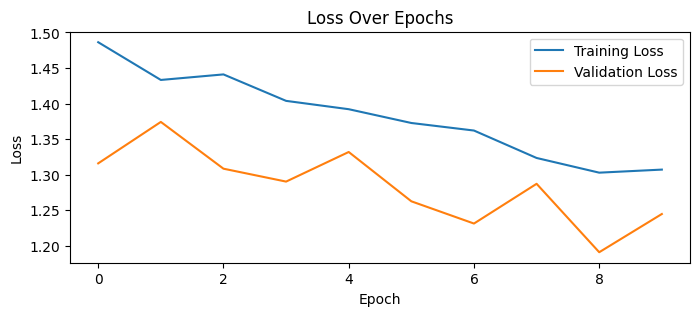

In [20]:
plt.figure(figsize=(8, 3))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [21]:
#load the fine-tuned model for final submission
#trained on 10k train records, hyperparameters used batch size 32, lr 0.00001, epochs=100
#model_path = ''
#model.load_state_dict(torch.load(model_path))

In [22]:
test_df = pd.read_csv(f'{data_path}/test.csv')
print(test_df.shape)
test_df.head()

(1, 3)


,spectrogram_id,eeg_id,patient_id
0,853520,3911565283,6885


In [23]:
parquet_path = f"{sg_test_path}/853520.parquet"
parquet_df = pd.read_parquet(parquet_path).reset_index()
print(parquet_df.shape)
parquet_df.head()

(300, 402)


,index,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,LL_2.34,LL_2.54,LL_2.73,LL_2.93,LL_3.13,LL_3.32,LL_3.52,LL_3.71,LL_3.91,LL_4.1,LL_4.3,LL_4.49,LL_4.69,LL_4.88,LL_5.08,LL_5.27,LL_5.47,LL_5.66,LL_5.86,LL_6.05,LL_6.25,LL_6.45,LL_6.64,LL_6.84,LL_7.03,LL_7.23,LL_7.42,LL_7.62,LL_7.81,LL_8.01,LL_8.2,LL_8.4,LL_8.59,LL_8.79,LL_8.98,LL_9.18,LL_9.38,LL_9.57,LL_9.77,LL_9.96,LL_10.16,LL_10.35,LL_10.55,LL_10.74,LL_10.94,LL_11.13,LL_11.33,LL_11.52,LL_11.72,LL_11.91,LL_12.11,LL_12.3,LL_12.5,LL_12.7,LL_12.89,LL_13.09,LL_13.28,LL_13.48,LL_13.67,LL_13.87,LL_14.06,LL_14.26,LL_14.45,LL_14.65,LL_14.84,LL_15.04,LL_15.23,LL_15.43,LL_15.63,LL_15.82,LL_16.02,LL_16.21,LL_16.41,LL_16.6,LL_16.8,LL_16.99,LL_17.19,LL_17.38,LL_17.58,LL_17.77,LL_17.97,LL_18.16,LL_18.36,LL_18.55,LL_18.75,LL_18.95,LL_19.14,LL_19.34,LL_19.53,LL_19.73,LL_19.92,RL_0.59,RL_0.78,RL_0.98,RL_1.17,RL_1.37,RL_1.56,RL_1.76,RL_1.95,RL_2.15,RL_2.34,RL_2.54,RL_2.73,RL_2.93,RL_3.13,RL_3.32,RL_3.52,RL_3.71,RL_3.91,RL_4.1,RL_4.3,RL_4.49,RL_4.69,RL_4.88,RL_5.08,RL_5.27,RL_5.47,RL_5.66,RL_5.86,RL_6.05,RL_6.25,RL_6.45,RL_6.64,RL_6.84,RL_7.03,RL_7.23,RL_7.42,RL_7.62,RL_7.81,RL_8.01,RL_8.2,RL_8.4,RL_8.59,RL_8.79,RL_8.98,RL_9.18,RL_9.38,RL_9.57,RL_9.77,RL_9.96,RL_10.16,RL_10.35,RL_10.55,RL_10.74,RL_10.94,RL_11.13,RL_11.33,RL_11.52,RL_11.72,RL_11.91,RL_12.11,RL_12.3,RL_12.5,RL_12.7,RL_12.89,RL_13.09,RL_13.28,RL_13.48,RL_13.67,RL_13.87,RL_14.06,RL_14.26,RL_14.45,RL_14.65,RL_14.84,RL_15.04,RL_15.23,RL_15.43,RL_15.63,RL_15.82,RL_16.02,RL_16.21,RL_16.41,RL_16.6,RL_16.8,RL_16.99,RL_17.19,RL_17.38,RL_17.58,RL_17.77,RL_17.97,RL_18.16,RL_18.36,RL_18.55,RL_18.75,RL_18.95,RL_19.14,RL_19.34,RL_19.53,RL_19.73,RL_19.92,LP_0.59,LP_0.78,LP_0.98,LP_1.17,LP_1.37,LP_1.56,LP_1.76,LP_1.95,LP_2.15,LP_2.34,LP_2.54,LP_2.73,LP_2.93,LP_3.13,LP_3.32,LP_3.52,LP_3.71,LP_3.91,LP_4.1,LP_4.3,LP_4.49,LP_4.69,LP_4.88,LP_5.08,LP_5.27,LP_5.47,LP_5.66,LP_5.86,LP_6.05,LP_6.25,LP_6.45,LP_6.64,LP_6.84,LP_7.03,LP_7.23,LP_7.42,LP_7.62,LP_7.81,LP_8.01,LP_8.2,LP_8.4,LP_8.59,LP_8.79,LP_8.98,LP_9.18,LP_9.38,LP_9.57,LP_9.77,LP_9.96,LP_10.16,LP_10.35,LP_10.55,LP_10.74,LP_10.94,LP_11.13,LP_11.33,LP_11.52,LP_11.72,LP_11.91,LP_12.11,LP_12.3,LP_12.5,LP_12.7,LP_12.89,LP_13.09,LP_13.28,LP_13.48,LP_13.67,LP_13.87,LP_14.06,LP_14.26,LP_14.45,LP_14.65,LP_14.84,LP_15.04,LP_15.23,LP_15.43,LP_15.63,LP_15.82,LP_16.02,LP_16.21,LP_16.41,LP_16.6,LP_16.8,LP_16.99,LP_17.19,LP_17.38,LP_17.58,LP_17.77,LP_17.97,LP_18.16,LP_18.36,LP_18.55,LP_18.75,LP_18.95,LP_19.14,LP_19.34,LP_19.53,LP_19.73,LP_19.92,RP_0.59,RP_0.78,RP_0.98,RP_1.17,RP_1.37,RP_1.56,RP_1.76,RP_1.95,RP_2.15,RP_2.34,RP_2.54,RP_2.73,RP_2.93,RP_3.13,RP_3.32,RP_3.52,RP_3.71,RP_3.91,RP_4.1,RP_4.3,RP_4.49,RP_4.69,RP_4.88,RP_5.08,RP_5.27,RP_5.47,RP_5.66,RP_5.86,RP_6.05,RP_6.25,RP_6.45,RP_6.64,RP_6.84,RP_7.03,RP_7.23,RP_7.42,RP_7.62,RP_7.81,RP_8.01,RP_8.2,RP_8.4,RP_8.59,RP_8.79,RP_8.98,RP_9.18,RP_9.38,RP_9.57,RP_9.77,RP_9.96,RP_10.16,RP_10.35,RP_10.55,RP_10.74,RP_10.94,RP_11.13,RP_11.33,RP_11.52,RP_11.72,RP_11.91,RP_12.11,RP_12.3,RP_12.5,RP_12.7,RP_12.89,RP_13.09,RP_13.28,RP_13.48,RP_13.67,RP_13.87,RP_14.06,RP_14.26,RP_14.45,RP_14.65,RP_14.84,RP_15.04,RP_15.23,RP_15.43,RP_15.63,RP_15.82,RP_16.02,RP_16.21,RP_16.41,RP_16.6,RP_16.8,RP_16.99,RP_17.19,RP_17.38,RP_17.58,RP_17.77,RP_17.97,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92
0,0,1,14.910000,17.110001,11.660000,11.73,6.08,4.54,4.31,3.38,2.05,1.46,1.04,0.97,1.31,1.14,1.06,0.72,0.52,0.42,0.58,0.89,0.94,0.69,0.56,0.42,0.38,0.47,0.53,0.41,0.77,0.81,0.85,0.97,0.54,0.54,0.55,0.85,0.92,0.87,0.91,0.64,0.45,0.39,0.33,0.55,0.44,0.45,0.51,0.85,0.92,0.94,1.00,0.50,0.43,0.57,0.88,0.53,0.96,1.16,0.93,0.92,0.70,1.21,1.64,1.68,1.70,1.25,1.00,0.84,0.77,1.95,2.19,2.10,2.32,1.36,1.43,1.14,1.11,1.27,1.37,1.72,1.48,1.66,1.27,1.47,1.66,2.68,3.85,4.43,4.25,2.74,3.06,3.66,3.36,3.90,4.76,3.08,3.72,4.58,3.13,3.54,31.299999,33.840000,26.510000,24.809999,22.700001,19.900000,12.280000,11.32,8.13,6.89,8.25,6.80,5.

In [24]:
# load spectrogram
sg_records_referred_list = []
for index, row in test_df.iterrows():
    parquet_path = f"{sg_test_path}/{row['spectrogram_id']}.parquet"
    parquet_df = pd.read_parquet(parquet_path).reset_index()
    #extract central 224 records
    filtered_df = parquet_df.iloc[38:262].copy()
    #filtered_df = parquet_df[(parquet_df['time'] >= 39) & 
    #                         (parquet_df['time'] <= 262)].copy()
    filtered_df['spectrogram_id'] = row['spectrogram_id']
    sg_records_referred_list.append(filtered_df)

# Concatenate all filtered records into a single DataFrame
sg_records_df = pd.concat(sg_records_referred_list, ignore_index=True)
sg_records_df = sg_records_df.drop_duplicates()

print(sg_records_df.shape)
sg_records_df.head()

(224, 403)


,index,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,LL_2.34,LL_2.54,LL_2.73,LL_2.93,LL_3.13,LL_3.32,LL_3.52,LL_3.71,LL_3.91,LL_4.1,LL_4.3,LL_4.49,LL_4.69,LL_4.88,LL_5.08,LL_5.27,LL_5.47,LL_5.66,LL_5.86,LL_6.05,LL_6.25,LL_6.45,LL_6.64,LL_6.84,LL_7.03,LL_7.23,LL_7.42,LL_7.62,LL_7.81,LL_8.01,LL_8.2,LL_8.4,LL_8.59,LL_8.79,LL_8.98,LL_9.18,LL_9.38,LL_9.57,LL_9.77,LL_9.96,LL_10.16,LL_10.35,LL_10.55,LL_10.74,LL_10.94,LL_11.13,LL_11.33,LL_11.52,LL_11.72,LL_11.91,LL_12.11,LL_12.3,LL_12.5,LL_12.7,LL_12.89,LL_13.09,LL_13.28,LL_13.48,LL_13.67,LL_13.87,LL_14.06,LL_14.26,LL_14.45,LL_14.65,LL_14.84,LL_15.04,LL_15.23,LL_15.43,LL_15.63,LL_15.82,LL_16.02,LL_16.21,LL_16.41,LL_16.6,LL_16.8,LL_16.99,LL_17.19,LL_17.38,LL_17.58,LL_17.77,LL_17.97,LL_18.16,LL_18.36,LL_18.55,LL_18.75,LL_18.95,LL_19.14,LL_19.34,LL_19.53,LL_19.73,LL_19.92,RL_0.59,RL_0.78,RL_0.98,RL_1.17,RL_1.37,RL_1.56,RL_1.76,RL_1.95,RL_2.15,RL_2.34,RL_2.54,RL_2.73,RL_2.93,RL_3.13,RL_3.32,RL_3.52,RL_3.71,RL_3.91,RL_4.1,RL_4.3,RL_4.49,RL_4.69,RL_4.88,RL_5.08,RL_5.27,RL_5.47,RL_5.66,RL_5.86,RL_6.05,RL_6.25,RL_6.45,RL_6.64,RL_6.84,RL_7.03,RL_7.23,RL_7.42,RL_7.62,RL_7.81,RL_8.01,RL_8.2,RL_8.4,RL_8.59,RL_8.79,RL_8.98,RL_9.18,RL_9.38,RL_9.57,RL_9.77,RL_9.96,RL_10.16,RL_10.35,RL_10.55,RL_10.74,RL_10.94,RL_11.13,RL_11.33,RL_11.52,RL_11.72,RL_11.91,RL_12.11,RL_12.3,RL_12.5,RL_12.7,RL_12.89,RL_13.09,RL_13.28,RL_13.48,RL_13.67,RL_13.87,RL_14.06,RL_14.26,RL_14.45,RL_14.65,RL_14.84,RL_15.04,RL_15.23,RL_15.43,RL_15.63,RL_15.82,RL_16.02,RL_16.21,RL_16.41,RL_16.6,RL_16.8,RL_16.99,RL_17.19,RL_17.38,RL_17.58,RL_17.77,RL_17.97,RL_18.16,RL_18.36,RL_18.55,RL_18.75,RL_18.95,RL_19.14,RL_19.34,RL_19.53,RL_19.73,RL_19.92,LP_0.59,LP_0.78,LP_0.98,LP_1.17,LP_1.37,LP_1.56,LP_1.76,LP_1.95,LP_2.15,LP_2.34,LP_2.54,LP_2.73,LP_2.93,LP_3.13,LP_3.32,LP_3.52,LP_3.71,LP_3.91,LP_4.1,LP_4.3,LP_4.49,LP_4.69,LP_4.88,LP_5.08,LP_5.27,LP_5.47,LP_5.66,LP_5.86,LP_6.05,LP_6.25,LP_6.45,LP_6.64,LP_6.84,LP_7.03,LP_7.23,LP_7.42,LP_7.62,LP_7.81,LP_8.01,LP_8.2,LP_8.4,LP_8.59,LP_8.79,LP_8.98,LP_9.18,LP_9.38,LP_9.57,LP_9.77,LP_9.96,LP_10.16,LP_10.35,LP_10.55,LP_10.74,LP_10.94,LP_11.13,LP_11.33,LP_11.52,LP_11.72,LP_11.91,LP_12.11,LP_12.3,LP_12.5,LP_12.7,LP_12.89,LP_13.09,LP_13.28,LP_13.48,LP_13.67,LP_13.87,LP_14.06,LP_14.26,LP_14.45,LP_14.65,LP_14.84,LP_15.04,LP_15.23,LP_15.43,LP_15.63,LP_15.82,LP_16.02,LP_16.21,LP_16.41,LP_16.6,LP_16.8,LP_16.99,LP_17.19,LP_17.38,LP_17.58,LP_17.77,LP_17.97,LP_18.16,LP_18.36,LP_18.55,LP_18.75,LP_18.95,LP_19.14,LP_19.34,LP_19.53,LP_19.73,LP_19.92,RP_0.59,RP_0.78,RP_0.98,RP_1.17,RP_1.37,RP_1.56,RP_1.76,RP_1.95,RP_2.15,RP_2.34,RP_2.54,RP_2.73,RP_2.93,RP_3.13,RP_3.32,RP_3.52,RP_3.71,RP_3.91,RP_4.1,RP_4.3,RP_4.49,RP_4.69,RP_4.88,RP_5.08,RP_5.27,RP_5.47,RP_5.66,RP_5.86,RP_6.05,RP_6.25,RP_6.45,RP_6.64,RP_6.84,RP_7.03,RP_7.23,RP_7.42,RP_7.62,RP_7.81,RP_8.01,RP_8.2,RP_8.4,RP_8.59,RP_8.79,RP_8.98,RP_9.18,RP_9.38,RP_9.57,RP_9.77,RP_9.96,RP_10.16,RP_10.35,RP_10.55,RP_10.74,RP_10.94,RP_11.13,RP_11.33,RP_11.52,RP_11.72,RP_11.91,RP_12.11,RP_12.3,RP_12.5,RP_12.7,RP_12.89,RP_13.09,RP_13.28,RP_13.48,RP_13.67,RP_13.87,RP_14.06,RP_14.26,RP_14.45,RP_14.65,RP_14.84,RP_15.04,RP_15.23,RP_15.43,RP_15.63,RP_15.82,RP_16.02,RP_16.21,RP_16.41,RP_16.6,RP_16.8,RP_16.99,RP_17.19,RP_17.38,RP_17.58,RP_17.77,RP_17.97,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92,spectrogram_id
0,38,77,22.51,26.080000,23.530001,22.610001,10.31,2.93,2.82,1.50,1.48,1.19,1.31,1.35,0.94,0.95,0.70,0.63,0.58,0.56,0.49,0.75,0.66,0.59,0.76,0.46,0.56,0.78,0.38,0.74,0.63,0.86,0.70,0.62,0.70,0.54,0.53,0.40,0.39,0.46,0.42,0.42,0.41,0.40,0.29,0.28,0.41,0.31,0.44,0.59,0.67,0.68,0.56,0.65,0.48,0.60,0.58,0.47,0.52,0.44,0.56,0.66,0.46,0.36,0.27,0.20,0.31,0.42,0.54,0.63,0.76,0.66,0.50,0.75,0.70,0.85,1.17,1.42,1.03,0.87,0.80,0.82,1.12,1.33,1.26,1.39,0.89,2.00,2.38,2.73,2.72,3.03,1.60,1.55,1.72,0.48,0.72,1.16,1.55,1.75,2.41,2.15,32.610001,29.420000,27.330000,20.940001,25.690001,25.969999,20.790001,13.010000,

In [25]:
#apply PCA to condense the 400 spectrogram features down to 224 principal components (PCs)

principal_components_df = pd.DataFrame()
for cluster_label, features in grouped_features.items():
    # Extract the subset of the DataFrame corresponding to the current cluster's features
    cluster_data = sg_records_df[features]
    
    # Standardize the features
    scaler = StandardScaler()
    cluster_data_standardized = scaler.fit_transform(cluster_data)
    
    # Initialize PCA with n_components=1 since we want to represent each cluster with a single component
    pca = PCA(n_components=1)
    
    # Fit PCA on the cluster data and transform the data
    principal_component = pca.fit_transform(cluster_data_standardized)
    
    # Convert the principal component to a DataFrame
    principal_component_df = pd.DataFrame(principal_component, columns=[f'PCA_{cluster_label}'])
    
    # Concatenate with the principal_components_df
    principal_components_df = pd.concat([principal_components_df, principal_component_df], axis=1)

# Assuming keys are stored in the 'keys' DataFrame
keys = sg_records_df[['spectrogram_id', 'time']].reset_index(drop=True)

# Concatenate the keys and the principal components
final_pc_df = pd.concat([keys, principal_components_df], axis=1)
print(final_pc_df.shape)
final_pc_df.head()


(224, 226)


,spectrogram_id,time,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,PCA_49,PCA_50,PCA_51,PCA_52,PCA_53,PCA_54,PCA_55,PCA_56,PCA_57,PCA_58,PCA_59,PCA_60,PCA_61,PCA_62,PCA_63,PCA_64,PCA_65,PCA_66,PCA_67,PCA_68,PCA_69,PCA_70,PCA_71,PCA_72,PCA_73,PCA_74,PCA_75,PCA_76,PCA_77,PCA_78,PCA_79,PCA_80,PCA_81,PCA_82,PCA_83,PCA_84,PCA_85,PCA_86,PCA_87,PCA_88,PCA_89,PCA_90,PCA_91,PCA_92,PCA_93,PCA_94,PCA_95,PCA_96,PCA_97,PCA_98,PCA_99,PCA_100,PCA_101,PCA_102,PCA_103,PCA_104,PCA_105,PCA_106,PCA_107,PCA_108,PCA_109,PCA_110,PCA_111,PCA_112,PCA_113,PCA_114,PCA_115,PCA_116,PCA_117,PCA_118,PCA_119,PCA_120,PCA_121,PCA_122,PCA_123,PCA_124,PCA_125,PCA_126,PCA_127,PCA_128,PCA_129,PCA_130,PCA_131,PCA_132,PCA_133,PCA_134,PCA_135,PCA_136,PCA_137,PCA_138,PCA_139,PCA_140,PCA_141,PCA_142,PCA_143,PCA_144,PCA_145,PCA_146,PCA_147,PCA_148,PCA_149,PCA_150,PCA_151,PCA_152,PCA_153,PCA_154,PCA_155,PCA_156,PCA_157,PCA_158,PCA_159,PCA_160,PCA_161,PCA_162,PCA_163,PCA_164,PCA_165,PCA_166,PCA_167,PCA_168,PCA_169,PCA_170,PCA_171,PCA_172,PCA_173,PCA_174,PCA_175,PCA_176,PCA_177,PCA_178,PCA_179,PCA_180,PCA_181,PCA_182,PCA_183,PCA_184,PCA_185,PCA_186,PCA_187,PCA_188,PCA_189,PCA_190,PCA_191,PCA_192,PCA_193,PCA_194,PCA_195,PCA_196,PCA_197,PCA_198,PCA_199,PCA_200,PCA_201,PCA_202,PCA_203,PCA_204,PCA_205,PCA_206,PCA_207,PCA_208,PCA_209,PCA_210,PCA_211,PCA_212,PCA_213,PCA_214,PCA_215,PCA_216,PCA_217,PCA_218,PCA_219,PCA_220,PCA_221,PCA_222,PCA_223,PCA_224
0,853520,77,0.035752,0.358445,0.133448,0.478776,-0.299184,-0.470372,-0.288822,-0.200227,-0.225076,0.786755,0.410598,-0.762274,0.319860,-0.317268,-1.377779,-0.294269,0.620406,-0.838500,1.469879,-1.030365,-0.918786,0.059500,0.012387,-1.164478,-0.476514,1.697473,-0.105587,0.387702,0.618933,0.281477,-0.918718,0.331065,-0.353192,0.274721,0.360641,-1.324538,-1.138105,-0.850017,-0.696422,-0.171506,-0.158071,1.917111,-0.163368,-0.322791,-0.666648,-0.072605,-1.470629,-1.475424,-0.604697,0.984927,-0.493312,1.787322,1.508878,-0.963773,-0.771579,-0.738189,-0.151156,-0.224633,-0.786766,-0.562000,-0.054594,2.614888,1.127754,-0.300664,-0.229415,-0.496614,-0.581335,-0.144824,-0.884135,-0.494586,0.508184,-0.124399,-0.530722,-0.970903,-0.897102,-0.189408,-0.281479,0.310025,0.205596,-0.924393,2.685336,0.091841,2.090213,0.108240,1.901670,2.465238,1.109383,0.081890,0.314956,-0.141234,-0.767751,0.260272,-0.072227,0.198615,-0.001272,0.003054,-0.153031,-0.292292,-0.227530,-0.373954,-0.294590,0.750665,0.646392,-0.207353,-0.159361,-0.539572,-0.506000,-0.220459,-0.242547,-0.277005,-0.512947,-0.093541,-0.237140,-0.439692,-0.025874,0.299004,-0.360367,-0.341164,0.240762,-0.187178,2.318426,0.212967,-0.520603,0.875627,-0.527610,-0.404193,-0.242885,0.579359,-0.311206,0.751095,-0.697927,-0.281473,0.768387,-0.335244,-0.391402,-0.773689,-0.007902,-0.908539,-1.860466,-0.576605,0.379661,0.592193,-0.400466,-0.185415,0.695389,-0.018043,-0.290345,-0.711813,-1.599383,-0.240986,-0.879757,-0.126434,0.005638,-1.076793,-0.085649,-2.226759,1.627341,0.708733,-0.087906,-1.272701,-1.263669,-0.202925,-0.616921,-0.190324,0.155569,1.067711,1.233207,-0.647785,0.736826,2.653379,0.598934,-0.253767,-1.135977,-0.694175,-0.037374,-0.433471,-1.216910,-0.790489,-0.525660,-0.206106,-1.227401,-0.075233,-0.248568,-0.784373,-1.324818,-1.767037,-0.581430,-0.118112,-0.241372,-0.559437,-0.577549,-0.509474,-0.276700,-0.211070,-0.195103,-0.687517,-1.807418,-0.302255,-0.178932,-0.438072,-0.565951,-1.097643,-1.118523,-1.779652,-1.862538,-1.024292,-0.235033,-1.005386,-1.419736,0.560610,0.129307,-0.425430,0.721027,0.678811,-0.631491,-0.989822,-0.106486,-1.753059,-1.683932,-1.236915,-0.413595,-1.700950,0.543946,0.468018
1,853520,79,-0.086783,0.357082,1.877949,1.924069,0.520412,-1.284247,-0.065475,1.988984,1.897735,1.935707,0.629

In [26]:
#combine spectrogram frame time series data into list and generate test record
processed_data = {} 
EmptySGs = []
for index, row in test_df.iterrows():
    # Extract relevant information from the row
    spectrogram_id = row['spectrogram_id']
    mask = (final_pc_df['spectrogram_id'] == spectrogram_id) 
    temp_df = final_pc_df[mask].reset_index(drop=True)
    
    # Check if the temp_df is not empty 
    if temp_df.shape[0] == 224 and temp_df.isnull().sum().sum() == 0:
        processed_data[spectrogram_id] = {'eeg_id': row['eeg_id']}
        for i in range(1, 225):  
            processed_data[spectrogram_id][f'PCA_{i}'] = []
        for i in range(1, 225):  
            processed_data[spectrogram_id][f'PCA_{i}'] += temp_df[f'PCA_{i}'].tolist()
    
    else :
        EmptySGs.append(spectrogram_id)
    
# Convert the processed_data dictionary to a DataFrame
final_test_data_byPCA = pd.DataFrame.from_dict(processed_data, orient='index')
final_test_data_byPCA.reset_index(inplace=True)

print(final_test_data_byPCA.shape)
print('Null or incorrect size #: ', EmptySGs)
final_test_data_byPCA.head()

(1, 226)
Null or incorrect size #:  []


,index,eeg_id,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,PCA_11,PCA_12,PCA_13,PCA_14,PCA_15,PCA_16,PCA_17,PCA_18,PCA_19,PCA_20,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30,PCA_31,PCA_32,PCA_33,PCA_34,PCA_35,PCA_36,PCA_37,PCA_38,PCA_39,PCA_40,PCA_41,PCA_42,PCA_43,PCA_44,PCA_45,PCA_46,PCA_47,PCA_48,PCA_49,PCA_50,PCA_51,PCA_52,PCA_53,PCA_54,PCA_55,PCA_56,PCA_57,PCA_58,PCA_59,PCA_60,PCA_61,PCA_62,PCA_63,PCA_64,PCA_65,PCA_66,PCA_67,PCA_68,PCA_69,PCA_70,PCA_71,PCA_72,PCA_73,PCA_74,PCA_75,PCA_76,PCA_77,PCA_78,PCA_79,PCA_80,PCA_81,PCA_82,PCA_83,PCA_84,PCA_85,PCA_86,PCA_87,PCA_88,PCA_89,PCA_90,PCA_91,PCA_92,PCA_93,PCA_94,PCA_95,PCA_96,PCA_97,PCA_98,PCA_99,PCA_100,PCA_101,PCA_102,PCA_103,PCA_104,PCA_105,PCA_106,PCA_107,PCA_108,PCA_109,PCA_110,PCA_111,PCA_112,PCA_113,PCA_114,PCA_115,PCA_116,PCA_117,PCA_118,PCA_119,PCA_120,PCA_121,PCA_122,PCA_123,PCA_124,PCA_125,PCA_126,PCA_127,PCA_128,PCA_129,PCA_130,PCA_131,PCA_132,PCA_133,PCA_134,PCA_135,PCA_136,PCA_137,PCA_138,PCA_139,PCA_140,PCA_141,PCA_142,PCA_143,PCA_144,PCA_145,PCA_146,PCA_147,PCA_148,PCA_149,PCA_150,PCA_151,PCA_152,PCA_153,PCA_154,PCA_155,PCA_156,PCA_157,PCA_158,PCA_159,PCA_160,PCA_161,PCA_162,PCA_163,PCA_164,PCA_165,PCA_166,PCA_167,PCA_168,PCA_169,PCA_170,PCA_171,PCA_172,PCA_173,PCA_174,PCA_175,PCA_176,PCA_177,PCA_178,PCA_179,PCA_180,PCA_181,PCA_182,PCA_183,PCA_184,PCA_185,PCA_186,PCA_187,PCA_188,PCA_189,PCA_190,PCA_191,PCA_192,PCA_193,PCA_194,PCA_195,PCA_196,PCA_197,PCA_198,PCA_199,PCA_200,PCA_201,PCA_202,PCA_203,PCA_204,PCA_205,PCA_206,PCA_207,PCA_208,PCA_209,PCA_210,PCA_211,PCA_212,PCA_213,PCA_214,PCA_215,PCA_216,PCA_217,PCA_218,PCA_219,PCA_220,PCA_221,PCA_222,PCA_223,PCA_224
0,853520,3911565283,"[0.03575202822685242, -0.08678286522626877, 0....","[0.3584453761577606, 0.3570815324783325, 0.525...","[0.13344794511795044, 1.8779486417770386, 0.59...","[0.4787761867046356, 1.924068570137024, 1.4934...","[-0.29918426275253296, 0.5204116702079773, 0.5...","[-0.47037187218666077, -1.2842471599578857, 0....","[-0.2888217866420746, -0.06547538191080093, 0....","[-0.2002274990081787, 1.9889837503433228, 1.37...","[-0.22507551312446594, 1.8977349996566772, 2.1...","[0.7867549061775208, 1.9357073307037354, 0.232...","[0.41059809923171997, 0.6295105814933777, 1.03...","[-0.7622736096382141, -1.268136978149414, -0.7...","[0.31986004114151, -0.7555046677589417, 0.2171...","[-0.3172684609889984, -0.6280624866485596, -0....","[-1.3777785301208496, -0.41654127836227417, 0....","[-0.2942688763141632, -0.4878569543361664, -0....","[0.6204061508178711, 2.252311944961548, 3.0973...","[-0.8384996652603149, 2.02524733543396, 1.5893...","[1.4698786735534668, 2.920013427734375, 2.8456...","[-1.030364990234375, -0.9764732718467712, -1.1...","[-0.9187859892845154, -1.0248181819915771, -1....","[0.059499628841876984, 1.0714478492736816, -0....","[0.012387371622025967, 1.5734437704086304, 1.6...","[-1.1644781827926636, 2.7025561332702637, 3.56...","[-0.4765137732028961, 1.6970354318618774, 1.87...","[1.697473406791687, 2.8613386154174805, 3.5925...","[-0.10558667033910751, 3.363400459289551, 3.63...","[0.3877018094062805, 2.5432794094085693, 2.976...","[0.6189326643943787, 2.2411231994628906, 2.860...","[0.2814771831035614, 2.9498276710510254, 3.161...","[-0.9187176823616028, 4.871535301208496, 4.873...","[0.33106541633605957, 2.8228349685668945, 3.57...","[-0.3531917333602905, -0.21491867303848267, -1...","[0.2747207581996918, 0.4708390533924103, -0.46...","[0.3606414794921875, 1.0427724123001099, 1.335...","[-1.3245376348495483, -0.7801125049591064, -0....","[-1.1381053924560547, -0.5767076015472412, -0....","[-0.850017249584198, -0.437217116355896, -0.74...","[-0.6964223384857178, 0.42104604840278625, 1.3...","[-0.17150607705116272, 0.45700183510780334, 1....","[-0.15807080268859863, -0.9014362096786499, -0...","[1.9171110391616821, 0.7947040796279907, -0.74...","[-0.16336758434772491, 0.190949484705925, -0.2...","[-0.32279130816459656, 0.6953639388084412, 0.

In [27]:
images_tensor = transform_to_3channel_with_zeros(final_test_data_byPCA)
print(images_tensor.shape)
images_tensor[0]

torch.Size([1, 3, 224, 224])


tensor([[[ 0.0358, -0.0868,  0.6338,  ..., -0.4411, -0.6243,  0.1490],
         [ 0.3584,  0.3571,  0.5252,  ..., -0.8064, -0.4728,  1.1911],
         [ 0.1334,  1.8779,  0.5987,  ...,  0.0493,  0.2501, -0.4304],
         ...,
         [-1.7010, -1.0882, -2.0757,  ...,  4.0344,  2.6242,  0.7272],
         [ 0.5439,  2.1835, -0.6914,  ...,  2.0050,  2.0124,  2.6325],
         [ 0.4680,  0.7206, -0.2898,  ...,  0.7206,  1.6048,  0.3417]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         ...,
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

        [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0

In [28]:
model.eval()
with torch.no_grad():
   test_preds = model(images_tensor.to(device))
   test_preds = F.softmax(test_preds.logits, dim=1).cpu().numpy()
test_preds = pd.DataFrame(test_preds, columns=prob_columns)
#join eeg_id
test_preds['eeg_id'] = final_test_data_byPCA['eeg_id']
test_preds = test_preds[['eeg_id', 'seizure_prob', 'lpd_prob', 'gpd_prob', 'lrda_prob', 'grda_prob', 'other_prob']]
# Rename the columns by replacing 'prob' with 'vote'
test_preds.columns = test_preds.columns.str.replace('_prob', '_vote')
print(test_preds.shape)
test_preds.head()

(1, 7)


,eeg_id,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,3911565283,0.200115,0.075119,0.144611,0.037086,0.129951,0.413118


In [29]:
test_preds.to_csv("submission.csv", index=False)